# Moscow

### Inserting Imagery

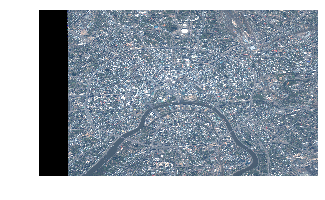

In [44]:
from gbdxtools.task import env
from gbdxtools import CatalogImage
%matplotlib inline

catalog_id = env.inputs.get('catalog_id', '2013050908464400000011623954')
bbox = env.inputs.get('bbox', '37.5619125366211, 55.717055261645456, 37.68550872802735, 55.79028014659872')

image = CatalogImage(catalog_id, band_type="MS", bbox=map(float, bbox.split(",")))
image.plot(w=5, h=5)

### Finding Imagery

In [123]:
from gbdxtools import CatalogImage

catalog_id = '2013050908464400000011623954'
image_moscow = CatalogImage(catalog_id)
image_moscow.shape

(4, 6115, 6723)

### Reprojecting Images

In [124]:
image_moscow = CatalogImage(catalog_id, proj="EPSG:4326")
image_moscow.shape

(4, 6115, 6723)

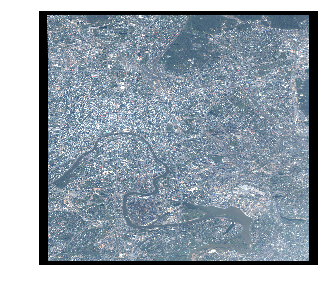

In [125]:
image_moscow.plot(w=5, h=5)

### Areas of Interest

In [151]:
bbox = [37.597, 55.745, 37.65, 55.77]

aoi = image_moscow.aoi(bbox=bbox, proj="EPSG:4326")
print('AOI Shape:', aoi.shape)

AOI Shape: (4, 869, 1844)


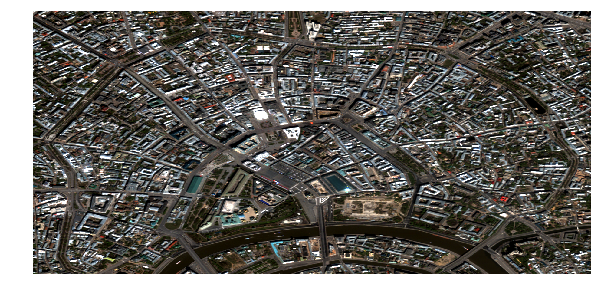

In [152]:
aoi.plot(w=10, h=10)

In [128]:
print (str(image.metadata['image']['sensorName']))

Four band (QuickBird and Ikonos scheme): Blue, Green, Red, Near-infrared


### Viewing Images

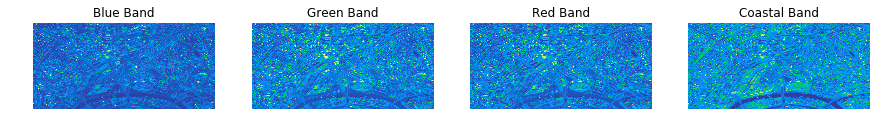

In [129]:
import matplotlib.pyplot as plt
bands = ["Blue", "Green", "Red", "Coastal"]
plt.figure(figsize=(15,15))
for i in range(4):
    plt.subplot(1, 4, i+1)
    plt.axis('off')
    plt.imshow(aoi[i,...], cmap="terrain")
    plt.title("{} Band".format(bands[i]))
plt.show()

### Different Bands

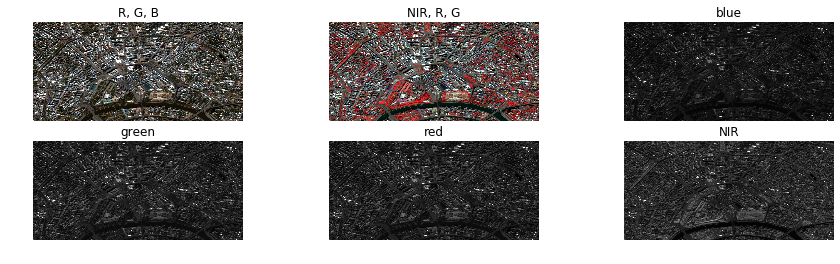

In [172]:
p_blue = aoi[0,:,:].astype(np.float32)
p_green = aoi[1,:,:].astype(np.float32)
p_red = aoi[2,:,:].astype(np.float32)
p_nir = aoi[3,:,:].astype(np.float32)

#In non-teaching code you would probably want this to be encapsualted into a function that
#just allowed you to pass in an arry of images or maybe a dict
fig = plt.figure(figsize=(15,4))

#plot the color image
a = fig.add_subplot(2,3,1)
a.axis('off')
a.set_title('R, G, B')
imgplot = plt.imshow(aoi.rgb(bands=[2,1,0]))

#plot the near infrared band with red and green
a = fig.add_subplot(2,3,2)
a.axis('off')
a.set_title('NIR, R, G')
imgplot = plt.imshow(aoi.rgb(bands=[3,2,1]))

#plot the blue band
a = fig.add_subplot(2,3,3)
a.axis('off')
a.set_title('blue')
#use a greyscale color ramp to show reflectance
imgplot = plt.imshow(p_blue, cmap="Greys_r")

#plot the green band
a = fig.add_subplot(2,3,4)
a.axis('off')
a.set_title('green')
imgplot = plt.imshow(p_green, cmap="Greys_r")

a = fig.add_subplot(2,3,5)
a.axis('off')
a.set_title('red')
imgplot = plt.imshow(p_red, cmap="Greys_r")

#plot the NIR band
a = fig.add_subplot(2,3,6)
a.axis('off')
a.set_title('NIR')
imgplot = plt.imshow(p_nir, cmap="Greys_r")


### Normalized Water Difference Index

Text(0.5, 1.0, 'NWDI')

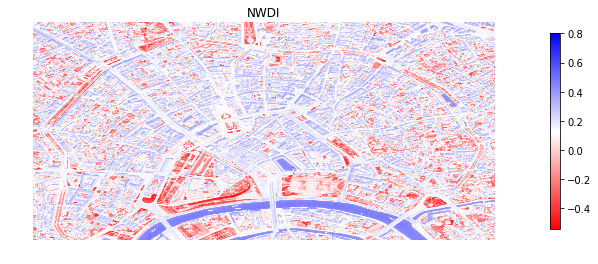

In [176]:
nwdi = ((p_green - p_nir)/(p_green + p_nir))
fig = plt.figure(figsize=(20,4))
im = plt.imshow(nwdi, cmap="bwr_r")
cbar=fig.colorbar(im,shrink=0.9)
plt.axis('off')
plt.title('NWDI')

### Finding Threshold Values

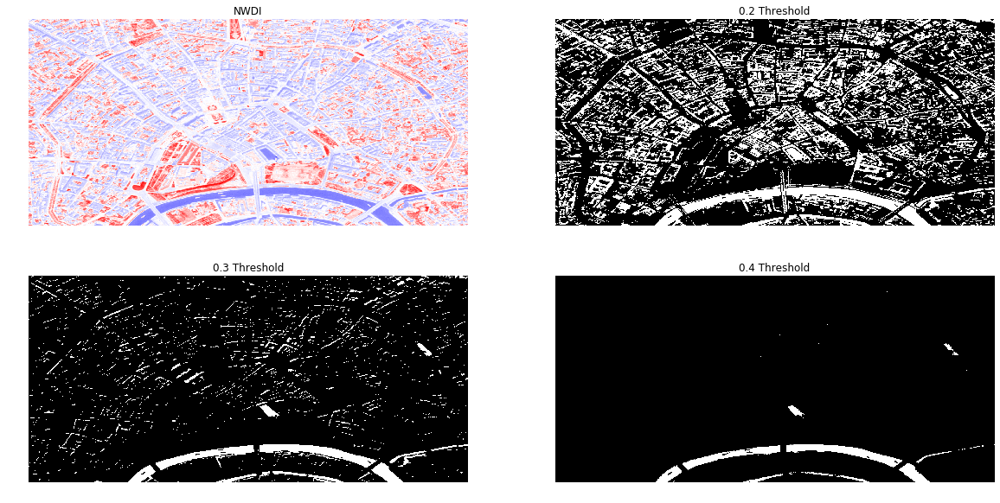

In [185]:
# Assignment in python just sets a reference NOT making a new copy. We don't need deepcopy because 
# our arrays are not compound objects
nwdipoint2 = nwdi.copy()
nwdipoint3 = nwdi.copy()
nwdipoint4 = nwdi.copy()

#Everything below 0.2 becomes a 0 and everything including 0.2 and above becomes 1
nwdipoint2 = nwdipoint2 >= 0.2
nwdipoint3 = nwdipoint3 >= 0.3
nwdipoint4 = nwdipoint4 >= 0.4

#plt.imshow(nwdipoint2, cmap='Greys')
fig = plt.figure(figsize=(20,10))
a = fig.add_subplot(2,2,1)
a.axis('off')
a.set_title('NWDI')
imgplot = plt.imshow(nwdi, cmap="bwr_r")

a = fig.add_subplot(2,2,2)
a.axis('off')
a.set_title('0.2 Threshold')
imgplot = plt.imshow(nwdipoint2, cmap="Greys_r")

a = fig.add_subplot(2,2,3)
a.axis('off')
a.set_title('0.3 Threshold')
imgplot = plt.imshow(nwdipoint3, cmap="Greys_r")

a = fig.add_subplot(2,2,4)
a.axis('off')
a.set_title('0.4 Threshold')
imgplot = plt.imshow(nwdipoint4, cmap="Greys_r")

### Using Mask

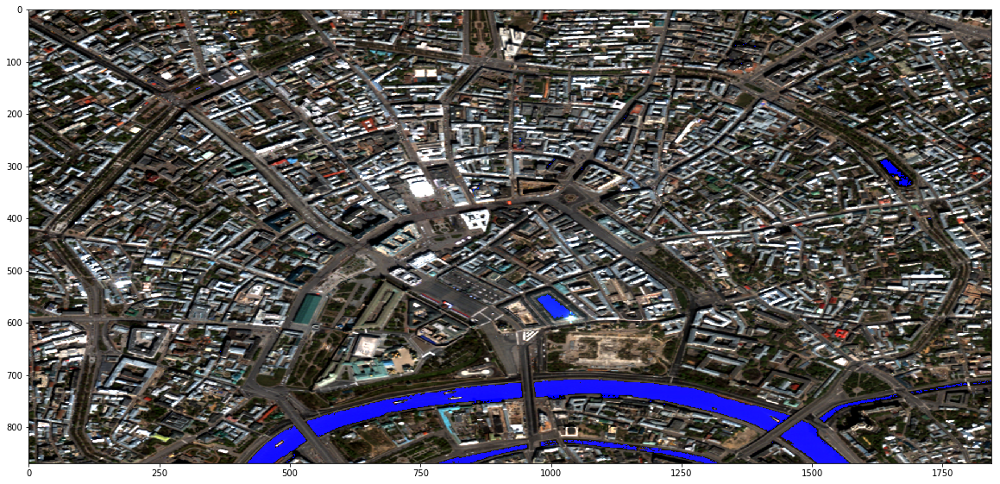

In [186]:
# Moscow image is the original satellite image
rgb = aoi.rgb(bands=[2,1,0])

# Set all the pixels in the image that had a True for 0.4 to blue
# To make blue we set the blue band to 255 (max) and the other two bands to 0
rgb[:,:,2][nwdipoint4] = [255]

fig = plt.figure(figsize=(20,20))
imgplot = plt.imshow(rgb)
plt.show()

### Pan Sharpening in Moscow with Landsat8

Text(0.5, 1.0, 'With Pan Sharpening')

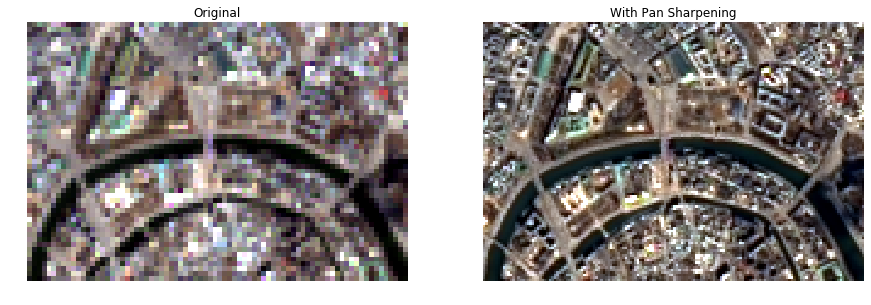

In [180]:
from gbdxtools.task import env
from gbdxtools import CatalogImage
%matplotlib inline

catalog_id = env.inputs.get('catalog_id', 'LC81790212019093LGN00')
bbox = env.inputs.get('bbox', '37.60705947875977, 55.74160767493425, 37.64379501342774, 55.75542369765257')

without_pansharpen = CatalogImage(catalog_id, band_type="MS", bbox=map(float, bbox.split(",")))
with_pansharpen = CatalogImage(catalog_id, band_type="MS", pansharpen=True, bbox=map(float, bbox.split(",")))

#make a figure that has 16 width and 8 height
fig = plt.figure(figsize=(15, 8))
a = fig.add_subplot(1, 2,1)
a.axis('off')
imgplot = plt.imshow(without_pansharpen.rgb(bands=[3,2,1]))
a.set_title('Original')
a = fig.add_subplot(1, 2, 2)
a.axis('off')
imgplot = plt.imshow(with_pansharpen.rgb(bands=[3,2,1]))
a.set_title('With Pan Sharpening')


### Atmospheric Correction

Text(0.5, 1.0, 'After')

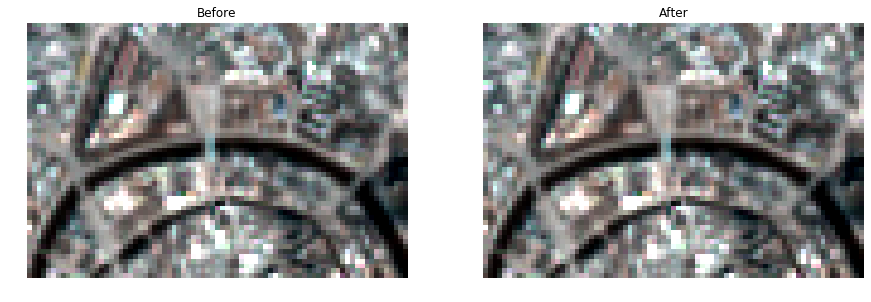

In [181]:
before_acomp = CatalogImage(catalog_id, band_type="MS", bbox=map(float, bbox.split(",")), proj="EPSG:3857")
after_acomp = CatalogImage(catalog_id, band_type="MS", bbox=map(float, bbox.split(",")), acomp=True, proj="EPSG:3857")

#make a figure that has 40 width and 40 height
fig = plt.figure(figsize=(15, 8))
a = fig.add_subplot(1, 2, 1)
a.axis('off')
imgplot = plt.imshow(before_acomp.rgb(bands=[2,1,0]))
a.set_title('Before')
a = fig.add_subplot(1, 2, 2)
a.axis('off')
imgplot = plt.imshow(after_acomp.rgb(bands=[2,1,0]))
a.set_title('After')         

 ### Fetching data into Numpy Arrays

In [42]:
nd_array = aoi.read()
print(nd_array.shape)
print('Max', nd_array.max())
print('Mean', nd_array.mean())
print('Min', nd_array.min())

(4, 556, 1531)
Max 2047
Mean 384.2453684994526
Min 76


### Accessing Metadata

In [28]:
print("CatID: {} instantiated as a {} {}-band raster with {} rows and {} columns".format(catalog_id, image.dtype, *image.shape))
print("  with geographic bounds: ({})".format(bbox))
print("  in projection: {}".format( image.metadata["georef"]["spatialReferenceSystemCode"]))
print("  at {:0.2f} meter resolution".format( image.metadata["image"]["groundSampleDistanceMeters"]))
print("  taken on {}".format( image.metadata["image"]["acquisitionDate"]))

CatID: 2013050908464400000011623954 instantiated as a uint16 4-band raster with 6115 rows and 6723 columns
  with geographic bounds: ([37.596, 55.744, 37.64, 55.76])
  in projection: EPSG:4326
  at 3.31 meter resolution
  taken on 2013-05-09T08:46:00Z


In [49]:
import json
print(json.dumps(image.ipe.metadata, indent=4))

{
    "image": {
        "imageId": "2013050908464400000011623954",
        "version": 1.1,
        "profileName": "georectified_image",
        "tilePartition": "0000",
        "tileXOffset": 0,
        "tileYOffset": 0,
        "numXTiles": 27,
        "numYTiles": 25,
        "tileXSize": 256,
        "tileYSize": 256,
        "numBands": 4,
        "dataType": "UNSIGNED_SHORT",
        "imageHeight": 6116,
        "imageWidth": 6724,
        "sensorPlatformName": "IKONOS-2",
        "sensorName": "Four band (QuickBird and Ikonos scheme): Blue, Green, Red, Near-infrared",
        "vendorDatasetIdentifier": "Geo:000:2013050908464400000011623954:1557774",
        "acquisitionDate": "2013-05-09T08:46:00Z",
        "colorInterpretation": "BGRN",
        "imageBoundsWGS84": "POLYGON ((37.5685637599009 55.83400912052194, 37.76185157880136 55.83400912052194, 37.76185157880136 55.6581988438421, 37.5685637599009 55.6581988438421, 37.5685637599009 55.83400912052194))",
        "groundSampleDi

/anaconda/envs/gbdx_py3/lib/python3.6/site-packages/gbdxtools/deprecate.py:11: GBDXDeprecation: The use of ipe/IPE has been deprecated. Please use rda/RDA.
  warnings.warn(message, GBDXDeprecation)


### Contouring Water Areas from Imagery

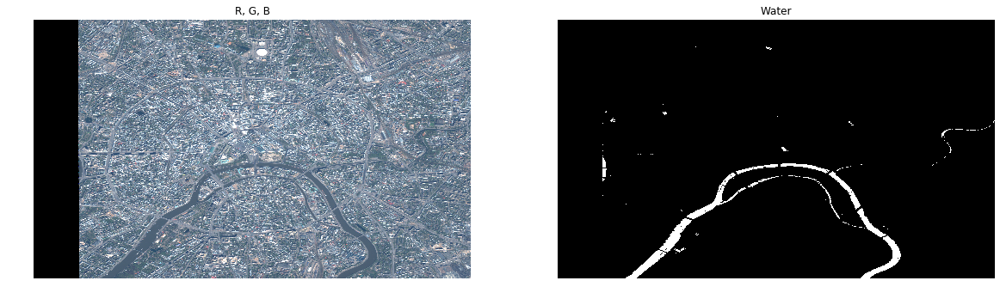

In [48]:
from gbdxtools.task import env
from gbdxtools import CatalogImage
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

catalog_id = env.inputs.get('catalog_id', '2013050908464400000011623954')
bbox = env.inputs.get('bbox', '37.5619125366211, 55.717055261645456, 37.68550872802735, 55.79028014659872')

#No Pan sharpening or Acomp
moscow_image = CatalogImage(catalog_id, band_type="MS", bbox=map(float, bbox.split(",")))

#Pull out the separate bands so we can calculate a water index
p_green = moscow_image[1,:,:].astype(np.float32)
p_nir = moscow_image[3,:,:].astype(np.float32)

#Calculate the water index
nwdi = ((p_green - p_nir)/(p_green + p_nir))

#Create a band (raster) that has True for all the water locations and False everywhere else
nwdipoint3 = nwdi.copy()
nwdipoint3 = nwdipoint3 >= 0.4

#plot the color image
fig = plt.figure(figsize=(20,20))
a = fig.add_subplot(1,2,1)
a.axis('off')
a.set_title('R, G, B')
imgplot = plt.imshow(moscow_image.rgb(bands=[2,1,0]))

a = fig.add_subplot(1,2,2)
a.axis('off')
a.set_title('Water')
imgplot = plt.imshow(nwdipoint3, cmap="Greys_r")

### Installing New Python libraries

In [52]:
# use the ! to execute an operating system command in the environment under the notebook
!pip install geojson

import rasterio
import rasterio.features
import rasterio.warp
from geojson import Feature, Polygon, FeatureCollection

#create some space after the pip install messages
print('\n\n')

#look at the projection of the original image
print("Coordinate system is " + moscow_image.metadata['georef']['spatialReferenceSystemCode'])


# We need to cast our binary mask to an array and make sure it is an integer array. Trues = 1 and false = 0
int_nwdi = np.asarray(nwdipoint3,np.uint8)

features = []

for geom, val in rasterio.features.shapes(int_nwdi, transform = moscow_image.affine):
    if val == 1.0:
        #make a Polygon Feature for water
        new_feature = Feature(geometry = geom, properties={"LandCover": "water"})
    else:
        new_feature = Feature(geometry = geom, properties={"LandCover": "not_water"})
    features.append(new_feature)

# Now put our features in a featureCollection
feature_collection = FeatureCollection(features)

feature_collection




Coordinate system is EPSG:4326


{"features": [{"geometry": {"coordinates": [[[37.635053159829035, 55.78959661603039], [37.635053159829035, 55.78956787007279], [37.635081905786635, 55.78956787007279], [37.635081905786635, 55.78959661603039], [37.635053159829035, 55.78959661603039]]], "type": "Polygon"}, "properties": {"LandCover": "water"}, "type": "Feature"}, {"geometry": {"coordinates": [[[37.57448542716644, 55.78953912411519], [37.57448542716644, 55.789337902411994], [37.57457166503924, 55.789337902411994], [37.57457166503924, 55.78951037815759], [37.57454291908164, 55.78951037815759], [37.57454291908164, 55.78953912411519], [37.57448542716644, 55.78953912411519]]], "type": "Polygon"}, "properties": {"LandCover": "water"}, "type": "Feature"}, {"geometry": {"coordinates": [[[37.636576695581816, 55.789280410496794], [37.636576695581816, 55.789251664539194], [37.636634187497016, 55.789251664539194], [37.636634187497016, 55.789280410496794], [37.636576695581816, 55.789280410496794]]], "type": "Polygon"}, "properties": 

### Export GeoJSON to File

In [63]:
import json
# open a file for writing
with open('moscow_water.json', 'w') as output:
    json.dump(feature_collection, output)
print("Done")

Done


# California

### Fires in California, Before and After

Sensor name is IKONOS-2


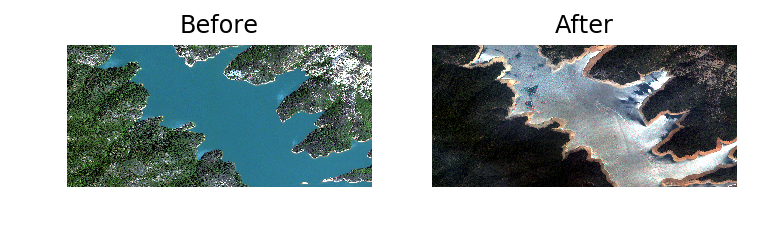

In [137]:
from gbdxtools.task import env
from gbdxtools import CatalogImage
%matplotlib inline

catalog_id_post = env.inputs.get('catalog_id', '104001004020F400')
catalog_id_pre = env.inputs.get('catalog_id', '103001006BD64A00')
bbox = env.inputs.get('bbox', '-122.42975234985353,40.77131186284329,-122.40262985229494,40.783920953279065')

pre_image = CatalogImage(catalog_id_pre, band_type="MS", bbox=map(float, bbox.split(",")))
post_image = CatalogImage(catalog_id_post, band_type="MS", bbox=map(float, bbox.split(",")))

#make a figure that has 16 width and 8 height
fig = plt.figure(dpi=144,figsize=(6, 3))
a = fig.add_subplot(1, 2,1)
a.axis('off')
imgplot = plt.imshow(pre_image.rgb(bands=[3,2,1]))
a.set_title('Before')
a = fig.add_subplot(1, 2, 2)
a.axis('off')
imgplot = plt.imshow(post_image.rgb(bands=[3,2,1]))
a.set_title('After')

print ("Sensor name is " + image.metadata['image']['sensorPlatformName'])

# Philllippines

### Typhoon in Phillippines

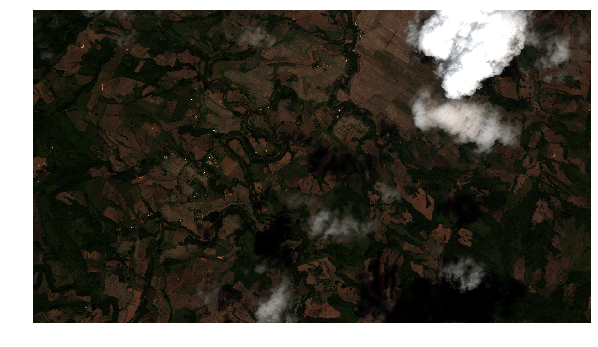

Sensor name is WV02


In [138]:
from gbdxtools.task import env
from gbdxtools import CatalogImage
%matplotlib inline

catalog_id = env.inputs.get('catalog_id', '103001007C3ED600')
bbox = env.inputs.get('bbox', '121.53968811035158,17.969915790561952,121.57556533813478,17.989999011158464')

image = CatalogImage(catalog_id, band_type="MS", bbox=map(float, bbox.split(",")))
image.plot(w=10, h=10)

print ("Sensor name is " + image.metadata['image']['sensorPlatformName'])

### Atmospheric correction in Phillippines

Text(0.5, 1.0, 'After')

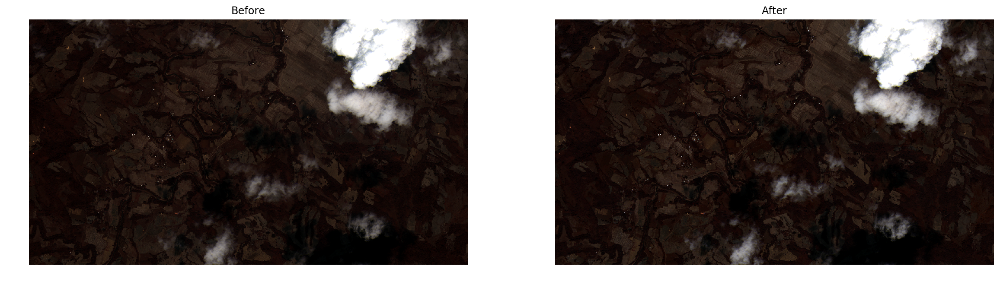

In [139]:
before_acomp = CatalogImage(catalog_id, band_type="MS", bbox=map(float, bbox.split(",")))
after_acomp = CatalogImage(catalog_id, band_type="MS", bbox=map(float, bbox.split(",")), acomp=True)

#make a figure that has 40 width and 40 height
fig = plt.figure(dpi=144,figsize=(20, 20))
a = fig.add_subplot(1, 2, 1)
a.axis('off')
imgplot = plt.imshow(before_acomp.rgb(bands=[2,1,0]))
a.set_title('Before')
a = fig.add_subplot(1, 2, 2)
a.axis('off')
imgplot = plt.imshow(after_acomp.rgb(bands=[2,1,0]))
a.set_title('After') 

# Introduction to Image Access with GBDXTools

DigitalGlobe has created a python library called `gbdxtools`. This library acts as a general purpose set of tools for accessing various APIs and features of the GBDX Platform. This notebook is an introduction to a specific set of features in `gbdxtools` that are designed to provide direct access to various forms of imagery available from DigitalGlobe.

To explore the full capabilities that gbdxtools provides, refer to the <a target="_blank" href="http://gbdxtools.readthedocs.io/en/latest/index.html">gbdxtools documentation</a>.

### Content

* [Initializing an Image](#Finding-Imagery)
* [Reprojecting Images](#Reprojecting-Images)
* [Areas of Interest](#Areas-of-Interest)
* [Accessing Metadata](#Accessing-Metadata)
* [Viewing Images](#Viewing-Images)
* [Fetching data into Numpy Arrays](#Fetching-data-into-Numpy-Arrays)
* [Panchromatic and Multispectal Bands](#Panchromatic-and-Multispectal-Bands)
* [Pansharpening](#Pansharping)
* [Creating Geotiffs](#Creating-Geotiffs)

# Finding Imagery

Searching for imagery can be accomplished by searching the DigitalGlobe imagery "catalog". For the purposes of this demo we'll assume that we've already found an image we want to access by using the <a target="_blank" href="http://gbdxtools.readthedocs.io/en/latest/catalog_search.html">gbdxtools catalog search</a> to find an image `CatalogID`. Here we'll be using a WorldView3 image with a `CatalogID` of `104001002073CC00`. 

In [130]:
from gbdxtools import CatalogImage

catalog_id = '104001002073CC00'
image2 = CatalogImage(catalog_id)
image2.shape

(8, 48771, 12608)

You can see the dimentions of the data we're working with (8 bands, 48771 rows, 12608 columns), but it's worth noting that pixel data has not been fetched from the server, only the metadata about the image dimension. Under the hood we're using <a href="https://dask.pydata.org/en/latest/" target="_blank">Dask</a> as the means for providing deferred access to the actual data. By leveraging dask we can treat the image as we would a numpy ndarray. We can index/slice the data, reshape it, and manipulate the data without fetching it until we need to access the actual data (ie when we want to plot or inspect actual data values).  

### Reprojecting Images

Image constructors except a `proj` parameter that will automatically reproject data into the given projection. Valid values for `proj` are `EPSG` codes in the form of: EPSG:4326, EPSG:3857, EPSG:36212, etc.

In [131]:
image2 = CatalogImage(catalog_id, proj="EPSG:3857")
image2.shape

(8, 56972, 12607)

### Areas of Interest

Slicing our image can take a few forms. The most common form of subsetting an image is by defining an Area of Interest (AOI). By using an AOI to subset our image we're manipulating the array's shape to reflect the shape of the data the AOI. We can define as many AOIs as we want and only fetch the raw data when we need to (for instance when we want to look at it). Here our AOI is a bounding box in the form `[minx, miny, maxx, maxy]` in geographic coordinates. 

In [133]:
bbox2 = [121.49037837982179, 31.23682070567235, 121.49917602539062, 31.244067484256615]

aoi2 = image2.aoi(bbox=bbox2)
print('AOI Shape:', aoi2.shape)

AOI Shape: (8, 701, 727)


You can see that the AOI's shape is much less than that of the full image. In addition to using a bounding box we can use a Well-Known-Text or GeoJSON object to define AOIs. The benefit of this strategy is that you take a single image strip and extract multiple AOIs very quickly, and without incurring the bandwidth cost of transferring data until we absolutely need to. 

### Accessing Metadata

The image classes in gbdxtools provide access to various metadata about the image including spatial data and other sensor acquisition attributes.  

In [4]:
print("CatID: {} instantiated as a {} {}-band raster with {} rows and {} columns".format(catalog_id, image.dtype, *image.shape))
print("  with geographic bounds: ({})".format(bbox))
print("  in projection: {}".format( image.metadata["georef"]["spatialReferenceSystemCode"]))
print("  at {:0.2f} meter resolution".format( image.metadata["image"]["groundSampleDistanceMeters"]))
print("  and {:0.2f} degrees off nadir".format( image.metadata["image"]["offNadirAngle"]))
print("  taken on {}".format( image.metadata["image"]["acquisitionDate"]))

CatID: 104001002073CC00 instantiated as a float32 8-band raster with 52627 rows and 11646 columns
  with geographic bounds: ([121.49037837982179, 31.23682070567235, 121.49917602539062, 31.244067484256615])
  in projection: EPSG:3857
  at 1.36 meter resolution
  and 18.50 degrees off nadir
  taken on 2016-07-21T02:51:57.352Z


All the image metadata, including georeferencing and RPCs info, are available on the ` image.metadata` property:

In [5]:
import json
print(json.dumps(image.ipe.metadata, indent=4))

{
    "georef": {
        "translateX": 13517955.38233803, 
        "translateY": 3686998.1639941586, 
        "scaleX": 1.4581859683601364, 
        "scaleY": -1.4581859683601364, 
        "shearY": 0.0, 
        "shearX": 0.0, 
        "spatialReferenceSystemCode": "EPSG:3857"
    }, 
    "image": {
        "maxX": 11646, 
        "maxY": 52627, 
        "satAzimuth": 133.1, 
        "sunAzimuth": 121.0, 
        "cloudCover": 0.0, 
        "imageId": "052f8429-f6c3-41d9-adab-7541017941b2", 
        "numYTiles": 206, 
        "numXTiles": 46, 
        "imageWidth": 11647, 
        "tileYSize": 256, 
        "sensorName": "8-band (Coastal, Blue, Green, Yellow, Red, Red-edge, NIR1, NIR2) Multispectral", 
        "minY": 0, 
        "maxTileX": 45, 
        "maxTileY": 205, 
        "minX": 0, 
        "vendorDatasetIdentifier": "LV1B:055511469010_01_P001:104001002073CC00:A0100101ECA89400", 
        "version": "1.0", 
        "numBands": 8, 
        "imageHeight": 52628, 
        "offNa

### Viewing Images

We can view AOIs by calling `aoi.plot()`. Each image comes with both an `rgb` and `plot` methods. These methods are helpers that determine how to display the image for previewing. If the image is a Panchromatic image it displays the single band, if its Multispectral data it attempts to render an RGB version of the image. You can pass `width` and `height` to the plot method to control the size of the rendered plot.

Note that calling plot will fetch data from the server, but it will only fetch the data for the AOI.

Additionally we can plot individual bands using `matplotlib` and standard numpy array indexing. 

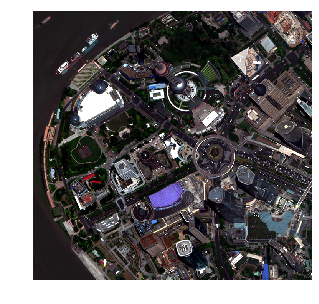

In [134]:
aoi2.plot(w=5, h=5)

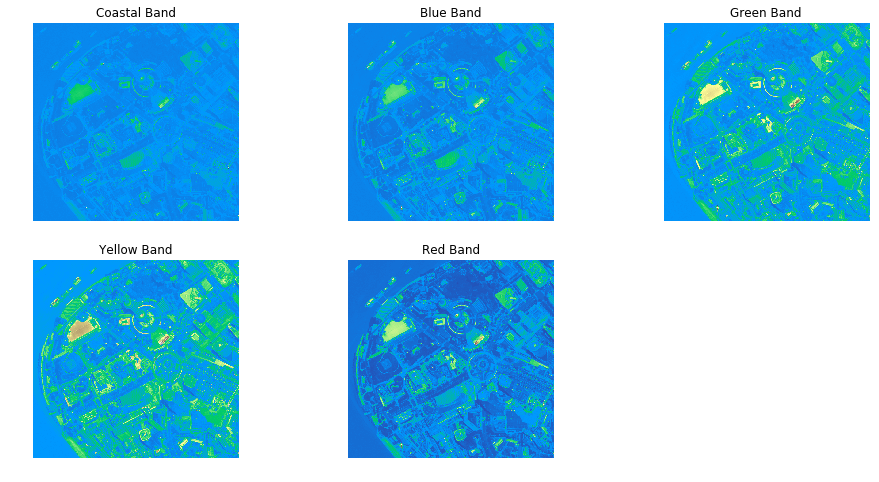

In [7]:
import matplotlib.pyplot as plt
bands = ["Coastal", "Blue", "Green", "Yellow", "Red"]
plt.figure(figsize=(16,8))
for i in range(5):
    plt.subplot(2, 3, i+1)
    plt.axis('off')
    plt.imshow(aoi[i,...], cmap="terrain")
    plt.title("{} Band".format(bands[i]))
plt.show()

### Fetching data into Numpy Arrays

The plot method above will automatically fetch what it needs from the server, but you can also fetch all data by calling the image's `read` method. By calling `read` we control how the data are fetched. In order to make the fetching of data as fast as possible we use parallel fetching to fetch many chunks of data from the server at once. This makes requests for larger areas as fast as possible. 

Calling `read` returns a numpy array <a target="_blank" href="http://www.numpy.org/">Numpy Array</a>, and allows us direct access to the raw pixel data of the image.

In [8]:
nd_array = aoi.read()
print(nd_array.shape)
print('Max', nd_array.max())
print('Mean', nd_array.mean())
print('Min', nd_array.min())

Fetching Image... 9 tiles
(8, 647, 672)
Max 1.90497
Mean 0.17804
Min -0.00740534


### Panchromatic and Multispectal Bands

WorldView 2 and 3 images have both multispectral and panchromatic bands. By default 'gbdxtools.CatalogImage' will provide `multispectral` bands, but this controllable by passing the `band_type='MS|Pan'` parameter to the constructor.

Multispectral data are 8 bands (Coastal, Blue, Green, Yellow, Red, Red-edge, NIR1, NIR2) at approximately a 2 meter resolution. The panchromatic band is served as a single band image at ~.5 meter resolution. 

### Pansharpening

The term "pansharpening" refers to the process of combining lower resolution multispectral bands with the higher resolution panchromatic band. This results in a high resolution color image. To perform pansharpening on a CatalogImage you pass the keyword parameter `pansharpen=False|True`. The default is false. 

Fetching Image... 9 tiles


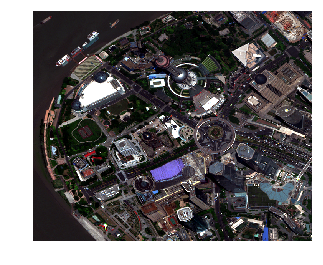

Fetching Image... 144 tiles


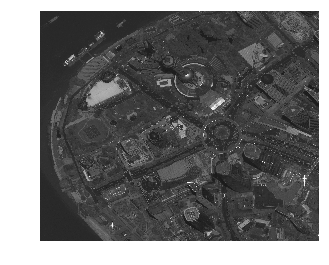

Fetching Image... 120 tiles


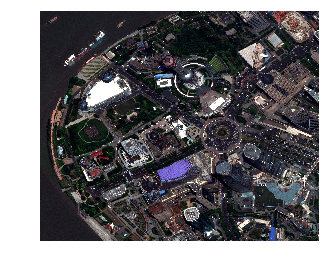

In [9]:
ms_img = CatalogImage(catalog_id, band_type='MS', bbox=bbox)
pan_img = CatalogImage(catalog_id, band_type='Pan', bbox=bbox)
psharp = CatalogImage(catalog_id, pansharpen=True, bbox=bbox)

ms_img.plot(w=5, h=5)
pan_img.plot(w=5, h=5)
psharp.plot(w=5, h=5)

### Creating Geotiffs

It can be useful for any number of reasons to save images to disk. Each image class provides a helper method that saves data as a valid GeoTiff file via the `image.geotiff` method. This method takes an optional `path`, `proj`, and `bands` arguments as well.

In [12]:
import numpy as np
tif = aoi.geotiff(path="aoi_rgb.tif", bands=[4,2,1], proj="EPSG:4326")


Driver: GTiff/GeoTIFF
Files: aoi_rgb.tif
Size is 672, 647
Coordinate System is:
GEOGCS["WGS 84",
    DATUM["WGS_1984",
        SPHEROID["WGS 84",6378137,298.257223563,
            AUTHORITY["EPSG","7030"]],
        AUTHORITY["EPSG","6326"]],
    PRIMEM["Greenwich",0],
    UNIT["degree",0.0174532925199433],
    AUTHORITY["EPSG","4326"]]
Origin = (13524245.996605535969138,3664486.689014615025371)
Pixel Size = (1.458185968360136,-1.458185968360136)
Metadata:
  AREA_OR_POINT=Area
Image Structure Metadata:
  INTERLEAVE=PIXEL
Corner Coordinates:
Upper Left  (13524245.997, 3664486.689) (Invalid angle,Invalid angle)
Lower Left  (13524245.997, 3663543.243) (Invalid angle,Invalid angle)
Upper Right (13525225.898, 3664486.689) (Invalid angle,Invalid angle)
Lower Right (13525225.898, 3663543.243) (Invalid angle,Invalid angle)
Center      (13524735.947, 3664014.966) (Invalid angle,Invalid angle)
Band 1 Block=256x256 Type=Float32, ColorInterp=Gray
Band 2 Block=256x256 Type=Float32, ColorInterp=Undef

Fetching Image... 9 tiles


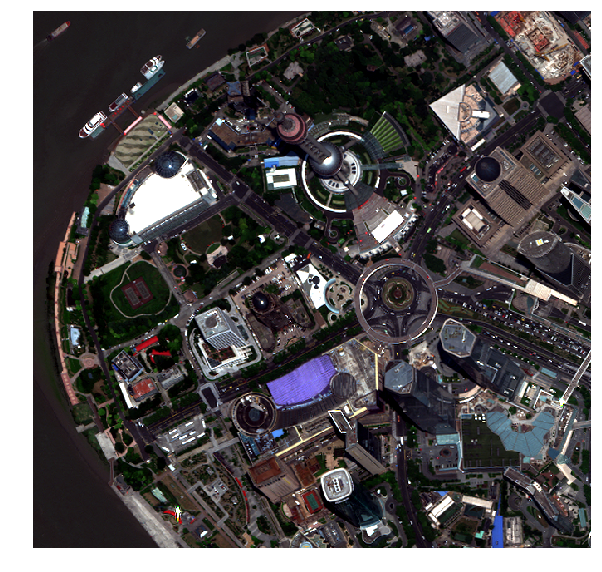

In [13]:
aoi.plot()